In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
import shap
from matplotlib import pyplot as plt

In [2]:
plt.rcParams.update({'figure.figsize': (100.0, 100.0)})
plt.rcParams.update({'font.size': 25})

In [3]:
multivariate = pd.read_excel("multivariateImputedDataset.xlsx")

In [4]:
y = multivariate['pCR (outcome)']
x = multivariate.drop(['pCR (outcome)', 'RelapseFreeSurvival (outcome)'], axis = 1).copy()

In [42]:
x.columns

Index(['Age', 'ER', 'PgR', 'HER2', 'TrippleNegative', 'ChemoGrade',
       'Proliferation', 'HistologyType', 'LNStatus', 'TumourStage',
       ...
       'original_glszm_SmallAreaHighGrayLevelEmphasis',
       'original_glszm_SmallAreaLowGrayLevelEmphasis',
       'original_glszm_ZoneEntropy', 'original_glszm_ZonePercentage',
       'original_glszm_ZoneVariance', 'original_ngtdm_Busyness',
       'original_ngtdm_Coarseness', 'original_ngtdm_Complexity',
       'original_ngtdm_Contrast', 'original_ngtdm_Strength'],
      dtype='object', length=117)

In [5]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

## Random Forest Using Built-In Feature  

In [6]:
rf = RandomForestRegressor(n_estimators=100)
                           
rf.fit(X_train, y_train)

RandomForestRegressor()

In [7]:
rf.feature_importances_

array([0.03354741, 0.01135072, 0.00152627, 0.04564368, 0.00311907,
       0.00051399, 0.00662696, 0.00047996, 0.00420194, 0.00537323,
       0.02355258, 0.03070589, 0.00986512, 0.02637732, 0.00967645,
       0.01418898, 0.02430007, 0.00803816, 0.01067945, 0.00892218,
       0.00855216, 0.00585193, 0.01153661, 0.00322605, 0.00454629,
       0.01186132, 0.00487251, 0.00033155, 0.01755837, 0.01451926,
       0.00986224, 0.00822824, 0.01197201, 0.01127531, 0.01737228,
       0.03274366, 0.00877808, 0.00658704, 0.02229701, 0.00375826,
       0.00168869, 0.00979959, 0.00254005, 0.00310652, 0.00273111,
       0.0017966 , 0.00204297, 0.00768221, 0.00177576, 0.00104792,
       0.00094399, 0.00201017, 0.00084782, 0.00122451, 0.0018673 ,
       0.01105898, 0.00731365, 0.00055207, 0.00094987, 0.0009322 ,
       0.00242508, 0.01085089, 0.00162787, 0.00212133, 0.00239204,
       0.0012419 , 0.00727842, 0.01354474, 0.00678337, 0.01437971,
       0.00559716, 0.0008513 , 0.00246356, 0.00217763, 0.01084

In [8]:
plt.barh(x.columns, rf.feature_importances_)

<BarContainer object of 117 artists>

In [9]:
sorted_idx = rf.feature_importances_.argsort()
plt.barh(x.columns[sorted_idx], rf.feature_importances_[sorted_idx])
plt.xlabel("Random Forest Feature Importance")

Text(0.5, 0, 'Random Forest Feature Importance')

## Permutation Based Feature Importance

In [10]:
perm_importance = permutation_importance(rf, X_test, y_test, random_state = 42)

In [11]:
sorted_idx = perm_importance.importances_mean.argsort()
plt.barh(x.columns[sorted_idx], perm_importance.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

Text(0.5, 0, 'Permutation Importance')

# Feature Importance Using SHAP Values

In [12]:
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_test)

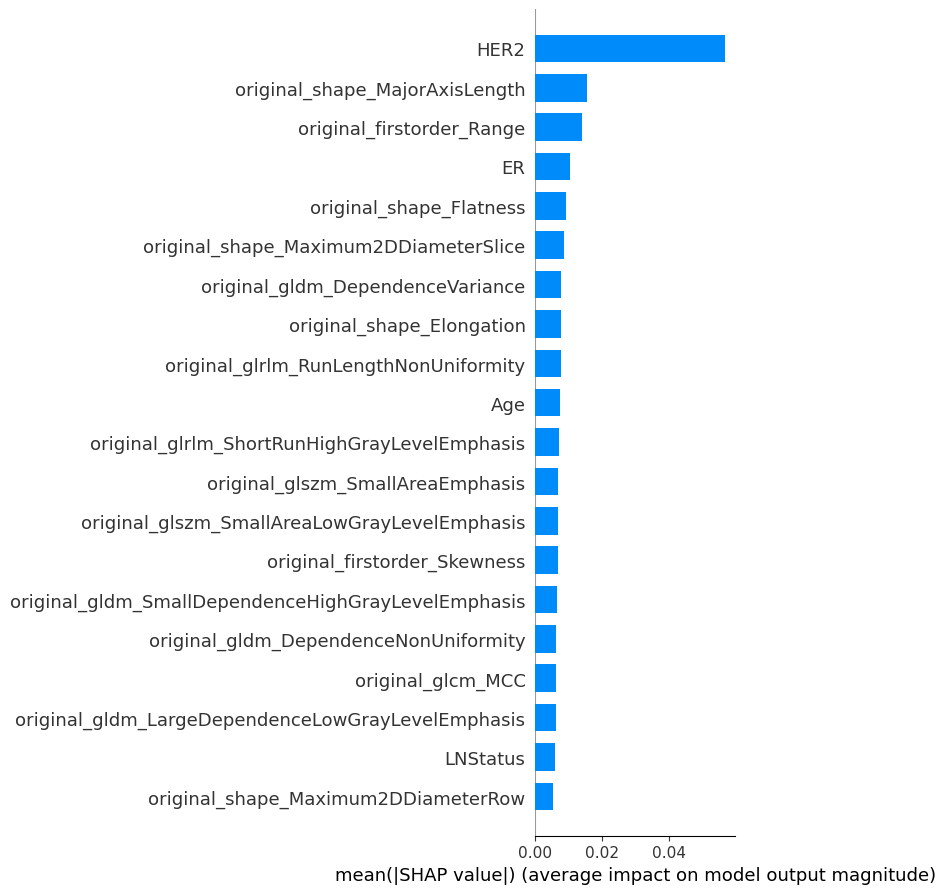

In [13]:
shap.summary_plot(shap_values, X_test, plot_type="bar")

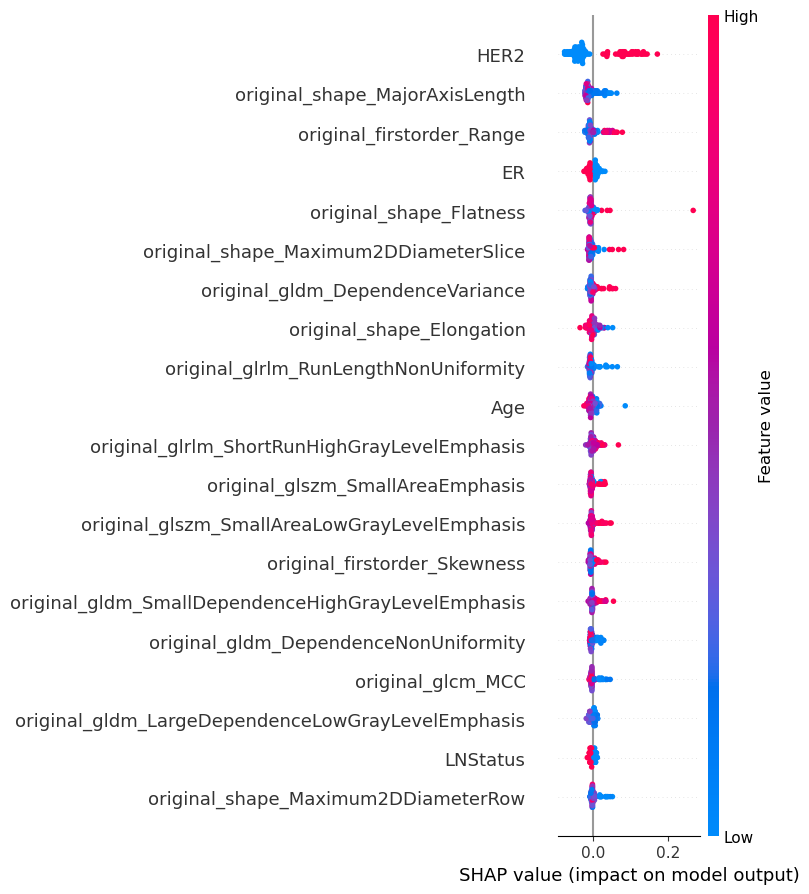

In [14]:
shap.summary_plot(shap_values, X_test)

# Classification

In [33]:
rf = RandomForestClassifier(n_estimators=100, random_state =42)

from sklearn.model_selection import GridSearchCV

# param_grid = { 
#     'n_estimators': [200, 500],
#     'max_features': ['auto', 'sqrt', 'log2'],
#     'max_depth' : [4,5,6,7,8],
#     'criterion' :['gini', 'entropy']
# }      
                           
# CV_rfc = GridSearchCV(estimator=rf, param_grid=param_grid, cv= 5)
# CV_rfc.fit(X_train, y_train)
# print(CV_rfc.best_params_)

rf = RandomForestClassifier(random_state=42, criterion="entropy", max_depth=7, max_features= "sqrt",n_estimators=200)
rf.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=7, max_features='sqrt',
                       n_estimators=200, random_state=42)

In [34]:
rf.feature_importances_

array([0.01686981, 0.00520036, 0.00193967, 0.01943044, 0.00233583,
       0.00165439, 0.00359575, 0.00068349, 0.00844294, 0.00805833,
       0.01225805, 0.01080607, 0.00754136, 0.01757986, 0.01152628,
       0.0102506 , 0.01745161, 0.01576854, 0.01106001, 0.01301461,
       0.01081094, 0.01356027, 0.00981223, 0.0104303 , 0.0054847 ,
       0.01491879, 0.01453857, 0.00411696, 0.01064659, 0.01080953,
       0.00872934, 0.0116157 , 0.01218695, 0.00729029, 0.00660036,
       0.01147534, 0.01073512, 0.01180762, 0.01056887, 0.01302461,
       0.00354611, 0.00788638, 0.00353826, 0.00654569, 0.0064118 ,
       0.00360053, 0.00349505, 0.01025636, 0.00374288, 0.00435735,
       0.00317439, 0.00418737, 0.00373261, 0.00365261, 0.00455878,
       0.00981752, 0.0085681 , 0.00396907, 0.004819  , 0.00536796,
       0.0035564 , 0.01003245, 0.00410468, 0.0047642 , 0.00538482,
       0.00390501, 0.00451587, 0.00680291, 0.00734465, 0.0091557 ,
       0.01044824, 0.00339493, 0.00349221, 0.00866938, 0.00820

In [35]:
plt.barh(x.columns, rf.feature_importances_)

<BarContainer object of 117 artists>

In [36]:
sorted_idx = rf.feature_importances_.argsort()
plt.barh(x.columns[sorted_idx], rf.feature_importances_[sorted_idx])
plt.xlabel("Random Forest Feature Importance")

Text(0.5, 0, 'Random Forest Feature Importance')

In [37]:
perm_importance = permutation_importance(rf, X_test, y_test, random_state=42)

In [38]:
sorted_idx = perm_importance.importances_mean.argsort()
plt.barh(x.columns[sorted_idx], perm_importance.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

Text(0.5, 0, 'Permutation Importance')

In [39]:
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_test)

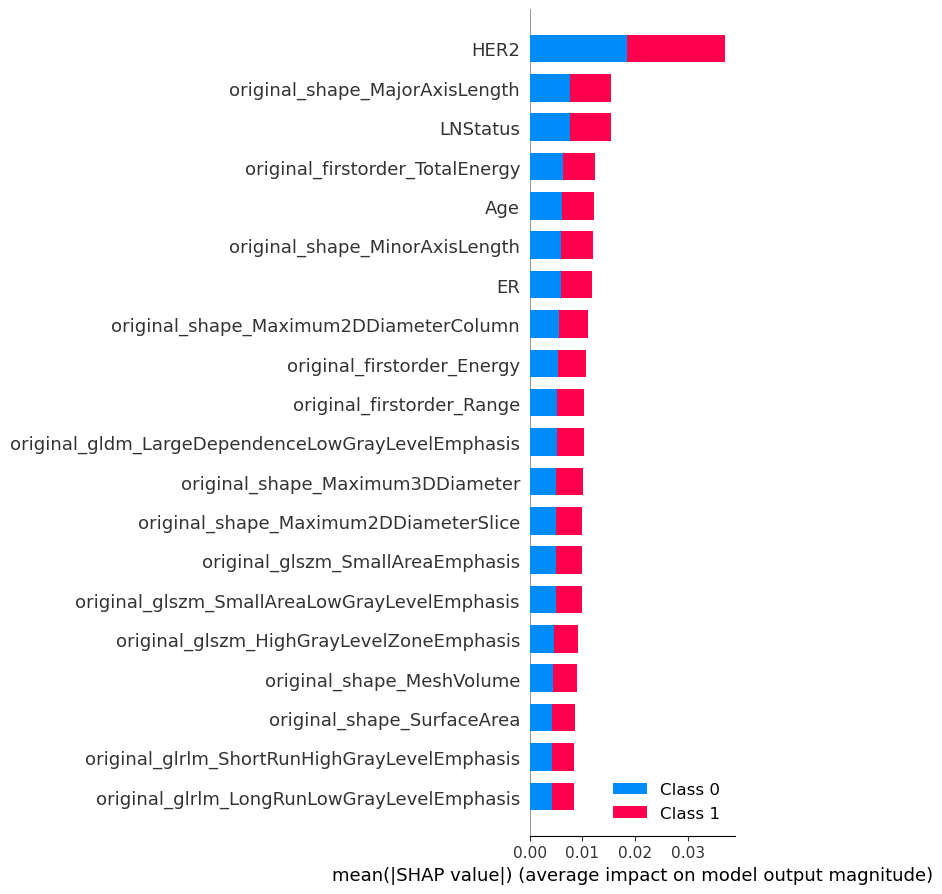

In [40]:
shap.summary_plot(shap_values, X_test, plot_type="bar")

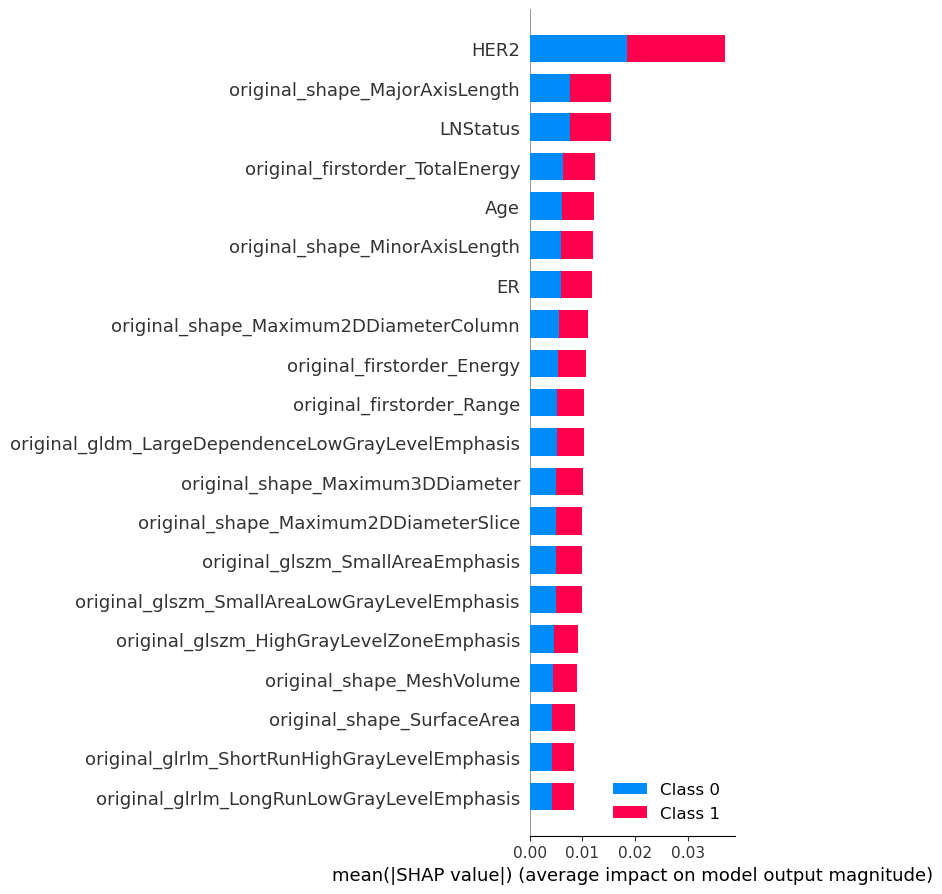

In [41]:
shap.summary_plot(shap_values, X_test)